In [1]:
%matplotlib inline
import matplotlib.pyplot as mplt
import numpy as np
import pymc3 as pm
import theano
import theano.tensor as tt 
from utils import *
from plotting import *
import plotly as plt
import plotly.graph_objects as go
from plotly.colors import n_colors
plt.offline.init_notebook_mode()
plt.io.templates.default = "none"
print(theano.config.device)

np.random.seed(42)
pm.set_tt_rng(42)


Loaded configuration file /lila/home/harrigan/.local/share/jupyter/runtime/kernel-10842749-87ff-46d0-ba0d-f57b0b023f72.json


cpu


Generate Data

In [2]:
import pandas as pd
counts = pd.read_csv('mutation_types_raw_counts.csv', index_col = [0], header = [0])[mut96]
cohorts = pd.read_csv('pcawg_cancer_types.csv')

In [3]:
cohorts.columns=['type', 'guid']
cohorts.type.unique()

array(['Ovary-AdenoCA', 'CNS-PiloAstro', 'Liver-HCC', 'CNS-Oligo',
       'Panc-Endocrine', 'Kidney-RCC', 'Prost-AdenoCA', 'Thy-AdenoCA',
       'ColoRect-AdenoCA', 'Lymph-BNHL', 'Uterus-AdenoCA',
       'Breast-AdenoCA', 'Lung-AdenoCA', 'Panc-AdenoCA', 'Eso-AdenoCA',
       'Head-SCC', 'CNS-Medullo', 'CNS-GBM', 'Bone-Leiomyo', 'Cervix-SCC',
       'Skin-Melanoma', 'Lymph-CLL', 'Kidney-ChRCC', 'Stomach-AdenoCA',
       'Lung-SCC', 'Bladder-TCC', 'Lymph-NOS', 'Myeloid-AML',
       'Biliary-AdenoCA', 'Breast-LobularCA', 'Cervix-AdenoCA',
       'Bone-Osteosarc', 'Breast-DCIS', 'Myeloid-MPN', 'Myeloid-MDS',
       'Bone-Cart', 'Bone-Epith'], dtype=object)

In [4]:

sel = counts.loc[cohorts.guid[[x in ['Kidney-RCC'] for x in cohorts.type]]].to_numpy()


In [5]:
sel

array([[141,  69,   8, ...,  36,  39,  78],
       [157,  73,  21, ...,  51,  39,  87],
       [184, 110,  24, ...,  80,  59, 176],
       ...,
       [228, 113,  24, ...,  47,  46, 117],
       [ 55,  40,  11, ...,  20,  24,  50],
       [ 88,  49,   6, ...,  28,  17,  58]])

In [6]:
# constants
C = 32
M = 3

# simulation shapes
N = sel.sum(1)
S = len(N)
print(S)

144


In [8]:
# data -> train, test
# train -> train, val
# test -> d', d''

train, test = split_by_S(sel)
train, val  = split_by_count(train)
d_prime, d_2prime = split_by_count(test)

Preview simulated signatures

In [60]:
plot_tau(sel).update_layout(height = 900)

use model factory to amend size conflicts in test

In [61]:
def collapsed_model_factory(corpus, J: int, K: int, alpha_bias: float, psi_bias: float, 
                            gamma_bias: float, beta_bias: float):
    
    S = corpus.shape[0]
    N = corpus.sum(1).reshape(S,1)
    
    with pm.Model() as model:
        
        data = pm.Data("data", corpus)
        phi = pm.Dirichlet('phi', a = np.ones(C) * alpha_bias, shape=(J, C))
        theta = pm.Dirichlet("theta", a = np.ones(J) * psi_bias, shape=(S, J))
        A = pm.Dirichlet("A", a = np.ones(K) * gamma_bias, shape = (S, J, K))
        # 4 is constant for ACGT
        beta = np.ones((K,4)) * beta_bias
        etaC = pm.Dirichlet("etaC", a=beta[:,[0,2,3]], shape=(1, K, M))
        etaT = pm.Dirichlet("etaT", a=beta[:,[0,1,2]], shape=(1, K, M))
        eta = pm.Deterministic('eta', pm.math.concatenate([etaC,etaT], axis=0))
        
        
        B = pm.Deterministic("B", (pm.math.matrix_dot(theta, phi).reshape((S,2,16))[:,:,None,:] * \
                                   pm.math.matrix_dot(tt.batched_dot(theta,A),eta)[:,:,:,None]).reshape((S, -1)))
        
        tt.printing.Print()(tt.batched_dot(theta,A).shape)
        tt.printing.Print()(eta.shape)
        tt.printing.Print()(pm.math.matrix_dot(tt.batched_dot(theta,A),eta).shape)
        tt.printing.Print()(model.etaC_stickbreaking__)
        
        # mutation counts
        lik = pm.Multinomial('corpus', n = N, p = B , observed=data)

    return model

In [62]:
model = collapsed_model_factory(train, 7, 7, 1, 1, 1, 1) 

 __str__ = [115   7]
 __str__ = [2 7 3]
 __str__ = [115   2   3]
 __str__ = [[[0. 0.]
  [0. 0.]
  [0. 0.]
  [0. 0.]
  [0. 0.]
  [0. 0.]
  [0. 0.]]]


In [63]:
with model:
    trace = pm.ADVI()
    trace.fit(50000)

Finished [100%]: Average Loss = 67,025


Diagnostic plots

In [64]:
fig = go.Figure(data=go.Scatter(x=np.arange(trace.hist.shape[0]), y=trace.hist))
fig.update_layout(title="ELBO", xaxis_title = 'iteration', height = 400)

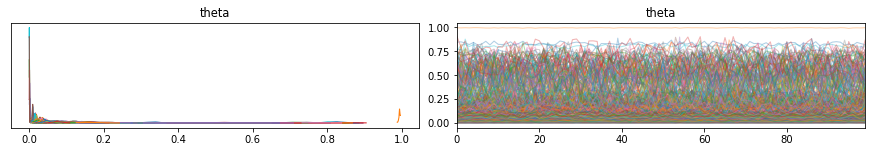

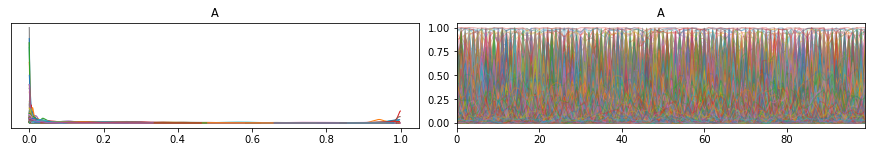

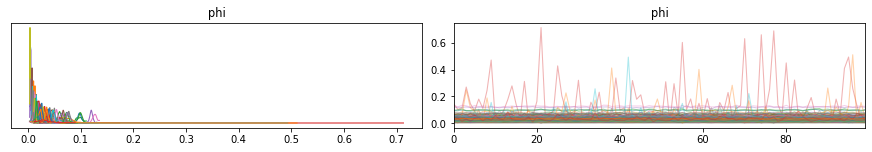

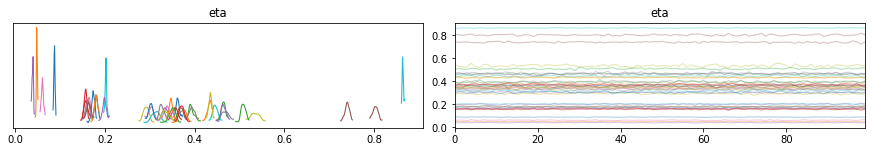

In [75]:
with model:
    pm.plot_trace(trace.approx.sample(100), var_names = 'theta');
    pm.plot_trace(trace.approx.sample(100), var_names = 'A');
    pm.plot_trace(trace.approx.sample(100), var_names = 'phi');
    pm.plot_trace(trace.approx.sample(100), var_names = 'eta');

In [66]:
#with collapsed_model:
#    ppc = pm.sample_posterior_predictive(advi_trace.approx.sample(100))
#    az.plot_ppc(az.from_pymc3(posterior_predictive=ppc, model=collapsed_model));

In [67]:
hat = trace.approx.sample(100)
hat.eta.shape

(100, 2, 7, 3)

In [68]:
plot_mean_std(hat.A)

In [69]:
phi = hat.phi.mean(0)
eta = hat.eta.mean(0)

In [76]:
A =hat.A.mean((0))
#plot_bipartite((A[1].T/A[1].sum(1)).T, rescale =18, direction = 'back')
plot_bipartite_J(A[0])

In [71]:
plot_phi(phi).show()
plot_eta(eta).show()

In [72]:
go.Figure(go.Heatmap(z=cosine_similarity(phi,phi).round(2), colorscale = 'viridis'))

In [73]:
go.Figure(go.Heatmap(z=cosine_similarity(flatten_eta(eta),flatten_eta(eta)).round(2), colorscale = 'viridis'))

In [74]:
tau_hat = get_tau(phi,eta)
plot_tau(tau_hat).show()

In [53]:
go.Figure(go.Heatmap(z=cosine_similarity(tau_hat,tau_hat).round(2), colorscale = 'viridis'))


-----
val


In [49]:
alp_B(val,hat.B.mean(0))

-3.726509479830041


-----
test

In [86]:
def collapsed_model_factory(corpus, J: int, K: int, alpha_bias: float, psi_bias: float, 
                            gamma_bias: float, beta_bias: float, phi_obs = None, eta_obs = None,):
    
    S = corpus.shape[0]
    N = corpus.sum(1).reshape(S,1)
    etaC_obs = eta_obs[0,None,:,:] if eta_obs is not None else eta_obs
    etaT_obs = eta_obs[1,None,:,:] if eta_obs is not None else eta_obs
    
    with pm.Model() as model:
        
        data = pm.Data("data", corpus)
        phi = pm.Dirichlet('phi', a = np.ones(C) * alpha_bias, shape=(J, C), observed=phi_obs)
        theta = pm.Dirichlet("theta", a = np.ones(J) * psi_bias, shape=(S, J))
        A = pm.Dirichlet("A", a = np.ones(K) * gamma_bias, shape = (S, J, K))
        # 4 is constant for ACGT
        beta = np.ones((K,4)) * beta_bias
        etaC = pm.Dirichlet("etaC", a=beta[:,[0,2,3]], shape=(1, K, M), observed=etaC_obs)
        etaT = pm.Dirichlet("etaT", a=beta[:,[0,1,2]], shape=(1, K, M), observed=etaT_obs)
        eta = pm.Deterministic('eta', pm.math.concatenate([etaC, etaT], axis=0))
        

        B = pm.Deterministic("B", (pm.math.matrix_dot(theta, phi).reshape((S,2,16))[:,:,None,:] * \
                                   pm.math.matrix_dot(tt.batched_dot(theta,A),eta)[:,:,:,None]).reshape((S, -1)))
        
        # mutation counts
        lik = pm.Multinomial('corpus', n = N, p = B , observed=data)

    return model


In [87]:
m2= collapsed_model_factory(test, 3, 2, np.repeat([1,1/1000],[31,1]), 1, 1, np.array([1,1,1,1]),trace.approx.sample_node(model.phi).eval(), 
                             trace.approx.sample_node(model.eta).eval())


In [88]:
with m2:
    trace_partialobs = pm.ADVI()
    trace_partialobs.fit(20000)

Finished [100%]: Average Loss = 91,034


In [89]:
plot_cossim(trace.approx.sample_node(m2.phi).eval(), trace.approx.sample_node(model.phi).eval())

In [90]:
plot_cossim(flatten_eta(trace.approx.sample_node(m2.eta).eval()), flatten_eta(trace.approx.sample_node(model.eta).eval()))

this is illegal because of size mismatch
```
plot_phi(trace.approx.sample_node(model.phi, more_replacements = {model.data: test}).eval())
```

In [92]:
fig = go.Figure(data=go.Scatter(x=np.arange(trace_partialobs.hist.shape[0]), y=trace.hist))
fig.update_layout(title="ELBO", xaxis_title = 'iteration')

In [93]:
trace_partialobs.approx.sample().varnames

['theta_stickbreaking__', 'A_stickbreaking__', 'theta', 'A', 'eta', 'B']

In [94]:
alp_B(test,trace_partialobs.approx.sample(100).B.mean(0))

-2.7421884058640273

(5, 96)